In [1]:
import numpy as np
import imgaug as ia
from imgaug import augmenters as iaa

In [2]:
from keras.preprocessing import image

Using TensorFlow backend.


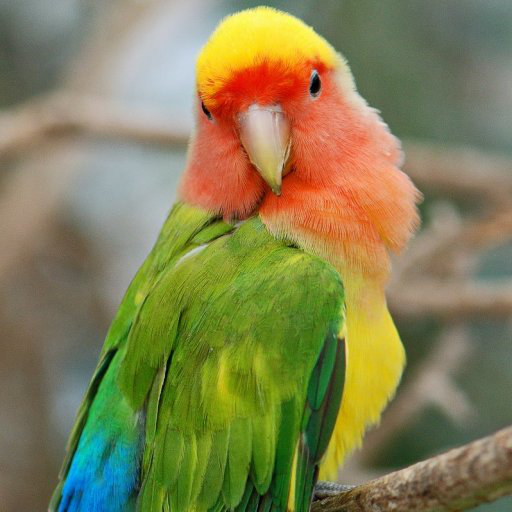

In [3]:
img = image.load_img('/Users/baris.ozmen/Desktop/parrot.jpg', target_size=(512,512))
img

In [4]:
X = image.img_to_array(img)
X

array([[[109., 120., 116.],
        [109., 120., 116.],
        [109., 120., 116.],
        ...,
        [119., 138., 134.],
        [119., 138., 134.],
        [119., 138., 134.]],

       [[105., 116., 112.],
        [106., 117., 113.],
        [107., 118., 114.],
        ...,
        [117., 136., 132.],
        [117., 136., 132.],
        [118., 137., 133.]],

       [[105., 116., 112.],
        [107., 118., 114.],
        [109., 120., 116.],
        ...,
        [116., 135., 131.],
        [116., 135., 131.],
        [117., 136., 132.]],

       ...,

       [[110.,  94.,  69.],
        [107.,  91.,  66.],
        [111.,  95.,  70.],
        ...,
        [ 79., 106.,  87.],
        [ 80., 107.,  88.],
        [ 82., 107.,  88.]],

       [[110.,  94.,  68.],
        [103.,  87.,  61.],
        [108.,  92.,  67.],
        ...,
        [ 79., 108.,  90.],
        [ 80., 107.,  88.],
        [ 81., 108.,  89.]],

       [[110.,  94.,  68.],
        [100.,  84.,  58.],
        [105.,  

In [203]:
def normalize(X):
    return (X/255.).copy()

def denormalize(X):
    X_dn = (X*255).copy()
    return X_dn

def augment_and_show(X, aug_type, magnitude):
    if aug_type == "crop":
        X_aug = iaa.Crop(px=(0, int(magnitude * 32))).augment_image(X)
    elif aug_type == "gaussian-blur":
        X_aug = iaa.GaussianBlur(sigma=(0, magnitude * 25.0)).augment_image(X)
    elif aug_type == "rotate":
        X_aug = iaa.Affine(rotate = (-180 * magnitude, 180 * magnitude)).augment_image(X)
    elif aug_type == "shear":
        X_aug = iaa.Affine(shear=(-90 * magnitude, 90 * magnitude)).augment_image(X)
    elif aug_type == "translate-x":
        X_aug = iaa.Affine(
            translate_percent={
                "x": (-magnitude, magnitude),
                "y": (0, 0)
            }
        ).augment_images(X)
    elif aug_type == "translate-y":
        X_aug = iaa.Affine(
            translate_percent={
                "x": (0, 0),
                "y": (-magnitude, magnitude)
            }
        ).augment_images(X)
    elif aug_type == "horizontal-flip":
        X_aug = iaa.Fliplr(magnitude).augment_image(X)
    elif aug_type == "vertical-flip":
        X_aug = iaa.Flipud(magnitude).augment_image(X)
    elif aug_type == "sharpen":
        X_aug = iaa.Sharpen(alpha=(0, 1.0), lightness=(0.50, 5 * magnitude)).augment_image(X)
    elif aug_type == "emboss":
        X_aug = iaa.Emboss(alpha=(0, 1.0), strength=(0.0, 20.0 * magnitude)).augment_image(X)
    elif aug_type == "additive-gaussian-noise":
        X_aug = iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, magnitude * 255), per_channel=0.5).augment_image(X)
    elif aug_type == "dropout":
        X_aug = iaa.Dropout((0.01, max(0.011, magnitude)), per_channel=0.5).augment_image(X) # Dropout first argument should be smaller than second one
    elif aug_type == "coarse-dropout":
        X_aug = iaa.CoarseDropout(
            (0.03, 0.15), size_percent=(0.30, np.log10(magnitude * 3)), per_channel=0.2
        ).augment_images(X)
    elif aug_type == "gamma-contrast":
        X_norm = normalize(X)
        X_aug_norm = iaa.GammaContrast(magnitude * 1.75).augment_image(X_norm) # needs 0-1 values
        X_aug = denormalize(X_aug_norm)
    elif aug_type == "brighten":
        X_aug = iaa.Add((int(-40 * magnitude), int(40 * magnitude)), per_channel=0.5).augment_image(X) # brighten
    elif aug_type == "invert":
        X_aug = iaa.Invert(1.0).augment_image(X) # magnitude not used
    elif aug_type == "fog":
        X_aug = iaa.Fog().augment_image(X) # magnitude not used
    elif aug_type == "clouds":
        X_aug = iaa.Clouds().augment_image(X) # magnitude not used
    elif aug_type == "histogram-equalize":
        X_aug = iaa.AllChannelsHistogramEqualization().augment_image(X) # magnitude not used
    elif aug_type == "super-pixels": # deprecated
        X_norm = normalize(X)
        X_norm2 = (X_norm*2)-1
        X_aug_norm2 = iaa.Superpixels(p_replace=(0, magnitude), n_segments=(100, 100)).augment_image(X_norm2)
        X_aug_norm = (X_aug_norm2+1)/2
        X_aug = denormalize(X_aug_norm)
    elif aug_type == "perspective-transform":
        X_norm = normalize(X)
        X_aug_norm = iaa.PerspectiveTransform(scale=(0.01, max(0.02, magnitude ))).augment_image(X_norm) # first scale param must be larger
        np.clip(X_aug_norm, 0.0, 1.0, out=X_aug_norm)
        X_aug = denormalize(X_aug_norm)
    elif aug_type == "elastic-transform": # deprecated
        X_norm = normalize(X)
        X_norm2 = (X_norm * 2) - 1
        X_aug_norm2 = iaa.ElasticTransformation(alpha=(0.0, max(0.5, magnitude*300)), sigma=5.0).augment_image(X_norm2)
        X_aug_norm = (X_aug_norm2 + 1) / 2
        X_aug = denormalize(X_aug_norm)
    elif aug_type == "add-to-hue-and-saturation":
        X_aug = iaa.AddToHueAndSaturation((int(-45*magnitude), int(45*magnitude))).augment_image(X)
    elif aug_type == "coarse-salt-pepper":
        X_aug = iaa.CoarseSaltAndPepper(p=0.2, size_percent=magnitude).augment_image(X)
    elif aug_type == "grayscale":
        X_aug = iaa.Grayscale(alpha=(0.0, magnitude)).augment_image(X)
    else:
        raise ValueError
    return image.array_to_img(X_aug)

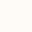

In [204]:
augment_and_show(X,"gaussian-blur", 6)

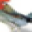

In [205]:
augment_and_show(X,"crop", 0.3)

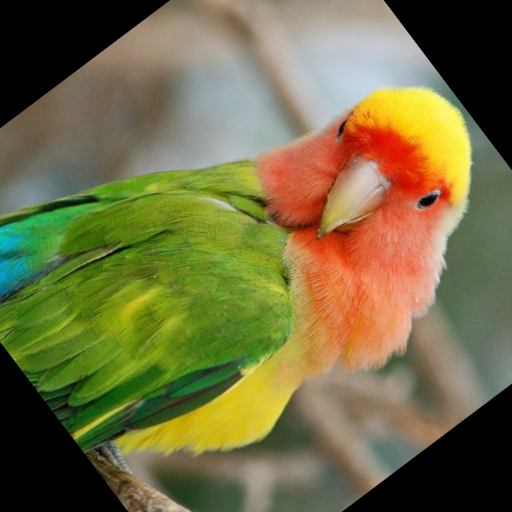

In [8]:
augment_and_show(X,"rotate", 0.4)

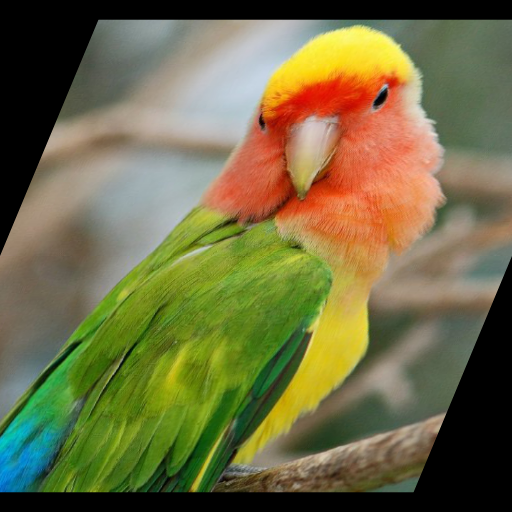

In [9]:
augment_and_show(X,"shear", 0.6)

/Users/baris.ozmen/miniconda3/envs/insight/lib/python3.6/site-packages/imgaug/augmenters/meta.py:464: UserWarning: You provided a numpy array of shape (512, 512, 3) as input to augment_images(), which was interpreted as (N, H, W). The last dimension however has value 1 or 3, which indicates that you provided a single image with shape (H, W, C) instead. If that is the case, you should use augment_image(image) or augment_images([image]), otherwise you will not get the expected augmentations.
  "you will not get the expected augmentations." % (images_copy.shape,))


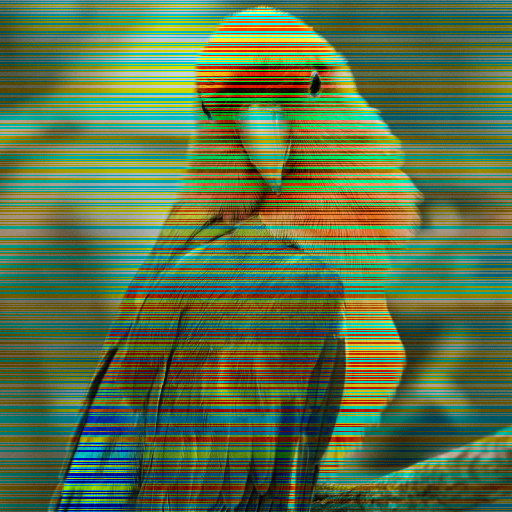

In [10]:
augment_and_show(X,"translate-x", 0.5)

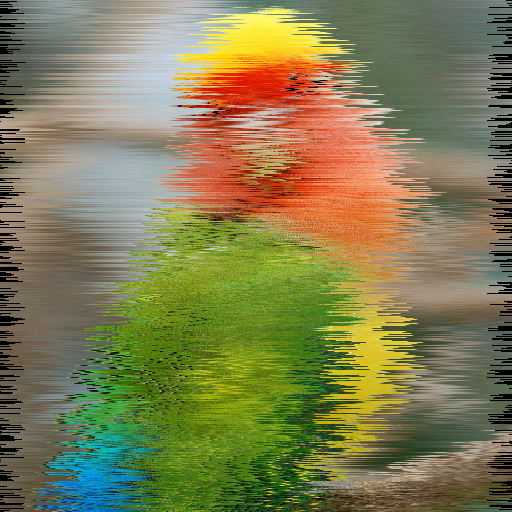

In [11]:
augment_and_show(X,"translate-y", 0.05)

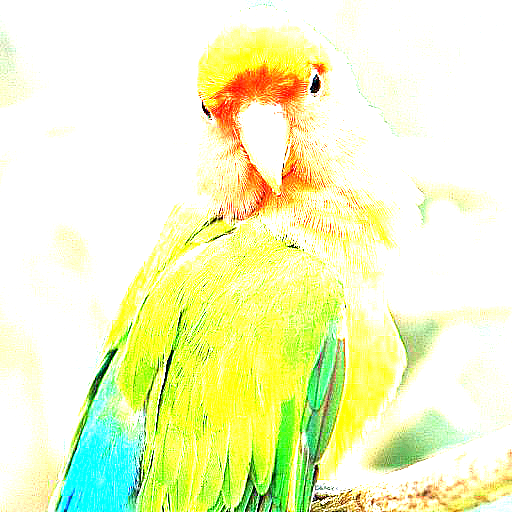

In [12]:
augment_and_show(X,"sharpen", 2)

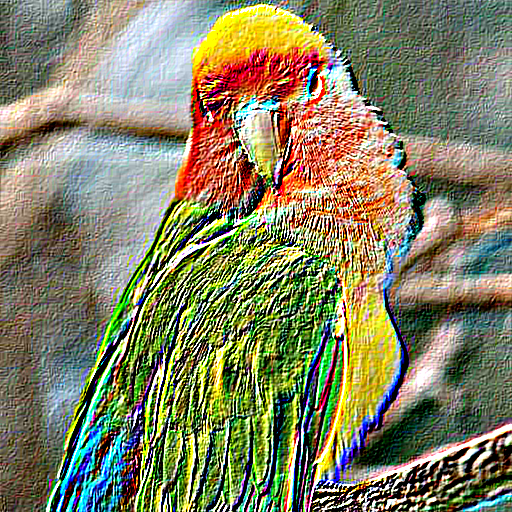

In [13]:
augment_and_show(X,"emboss", 1.0)

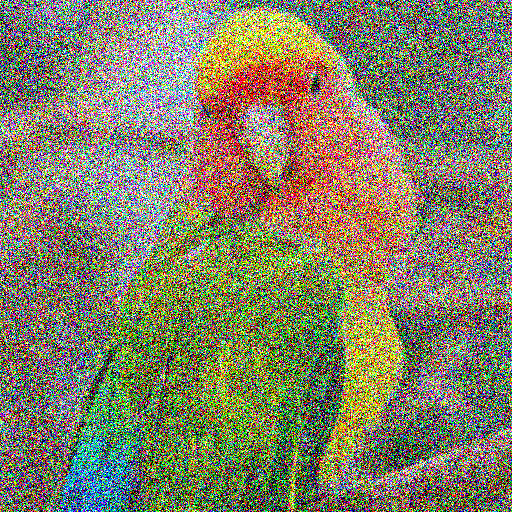

In [14]:
augment_and_show(X,"additive-gaussian-noise", 1)

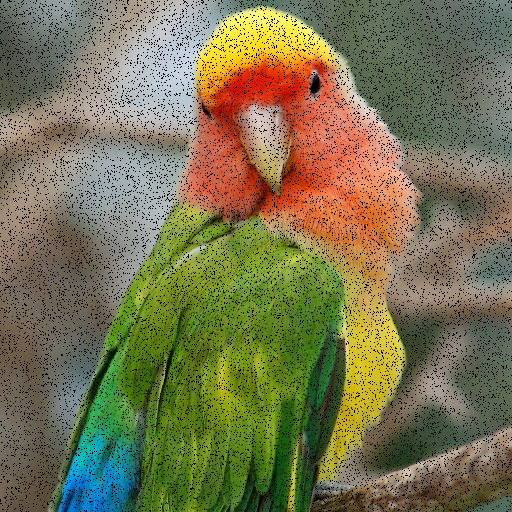

In [15]:
augment_and_show(X,"dropout", 0.6)

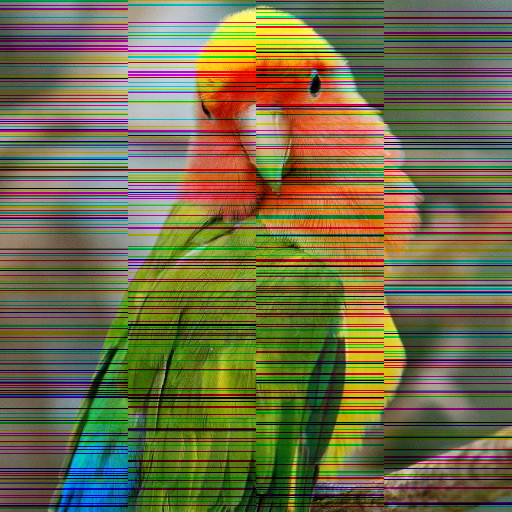

In [16]:
augment_and_show(X,"coarse-dropout", 0.0001)

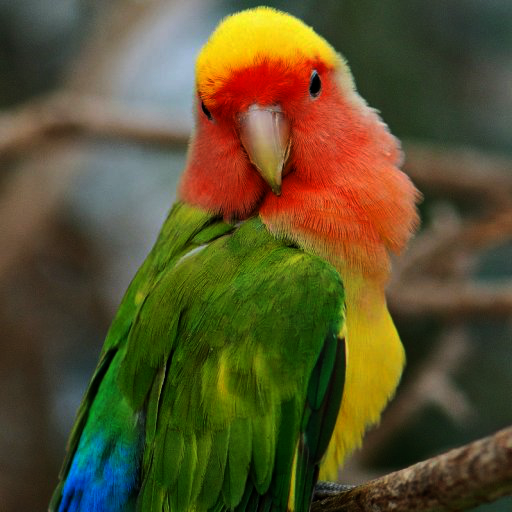

In [17]:
augment_and_show(X,"gamma-contrast", 1.0)

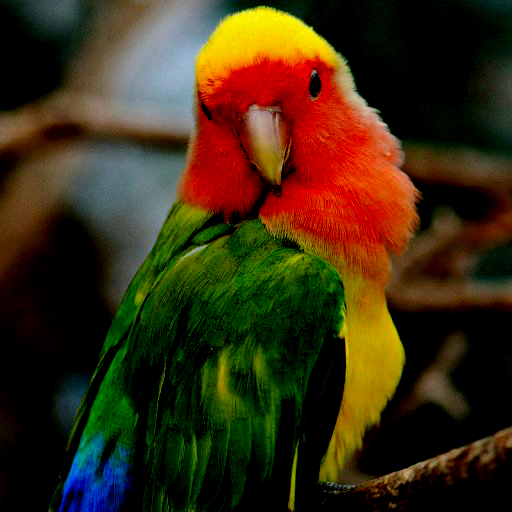

In [18]:
augment_and_show(X,"brighten", 3.0)

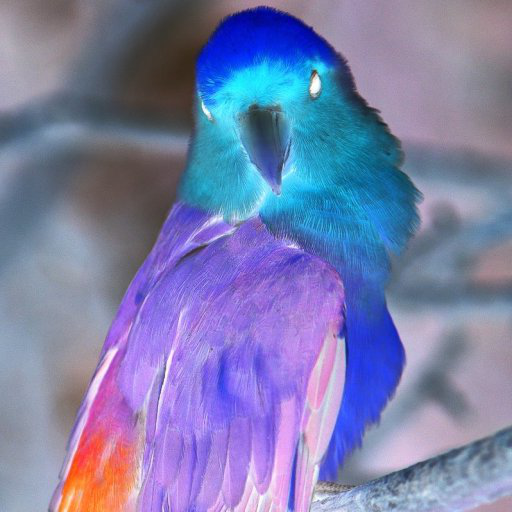

In [19]:
augment_and_show(X,"invert", 1.0)

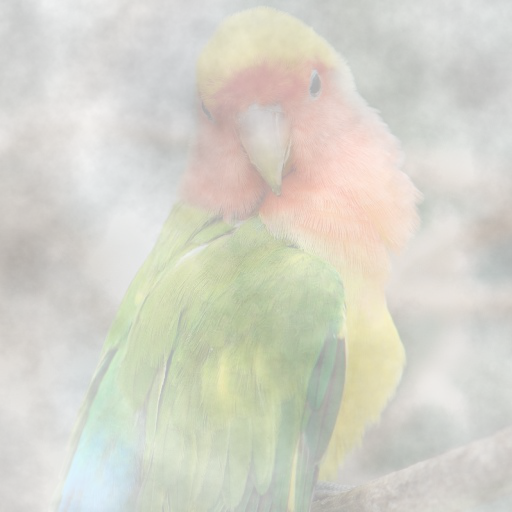

In [20]:
augment_and_show(X,"fog", 1.0)

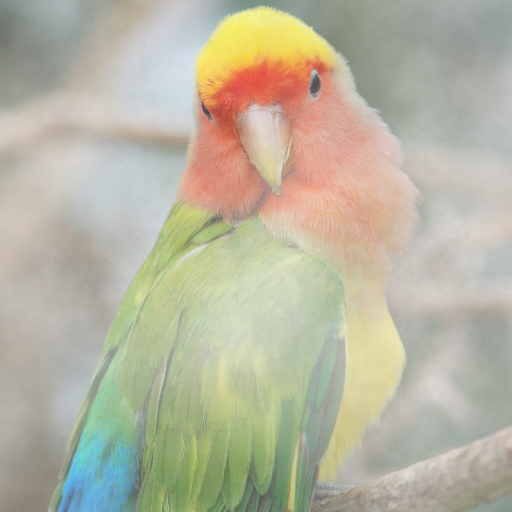

In [21]:
augment_and_show(X,"clouds", 1.0)

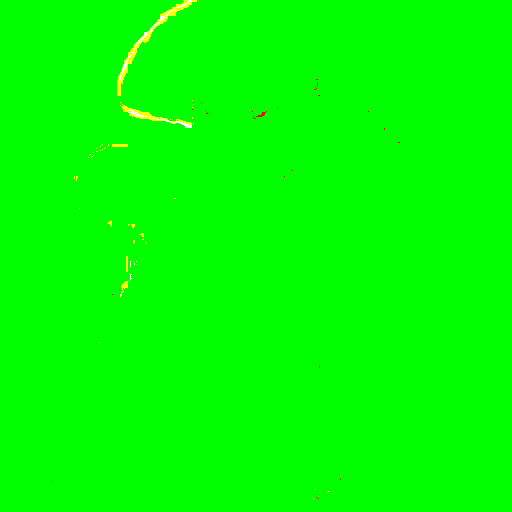

In [22]:
augment_and_show(X,"add-to-hue-and-saturation", 0.0003)

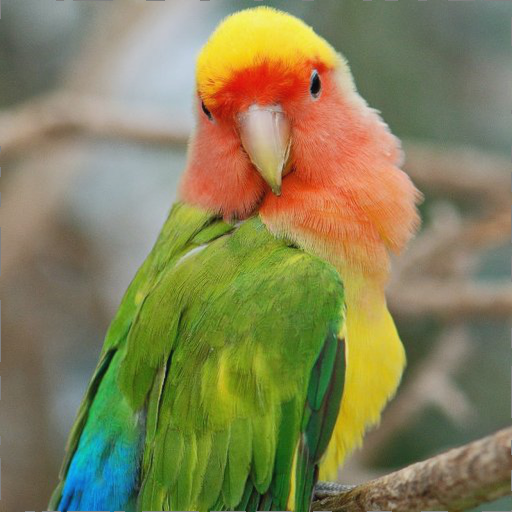

In [23]:
augment_and_show(X,"elastic-transform", 5.0)

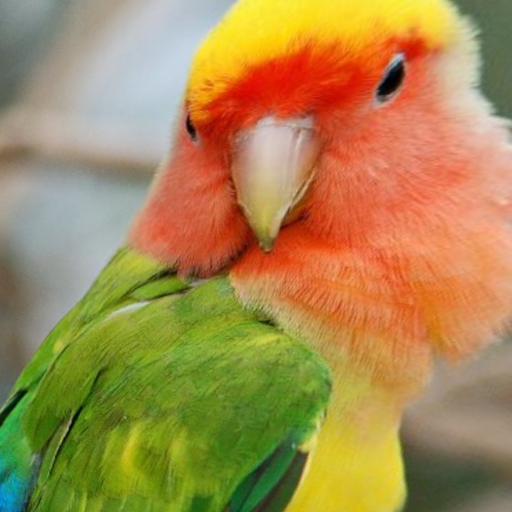

In [24]:
augment_and_show(X,"perspective-transform", 10.0)

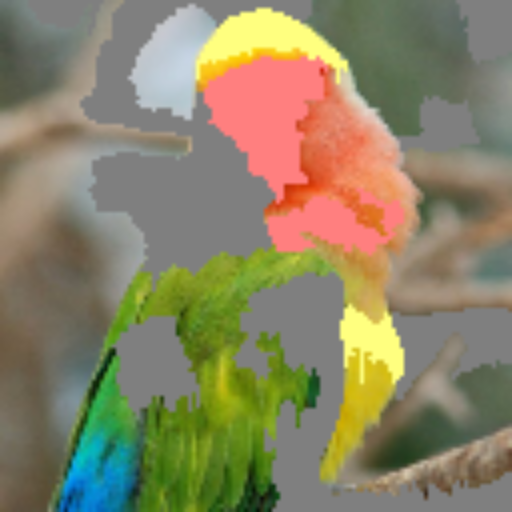

In [25]:
augment_and_show(X,"super-pixels",0.5)

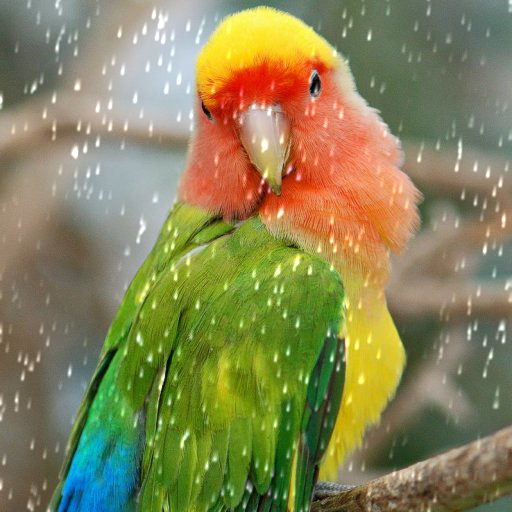

In [26]:
X_aug = iaa.Snowflakes().augment_image(X)
image.array_to_img(X_aug)

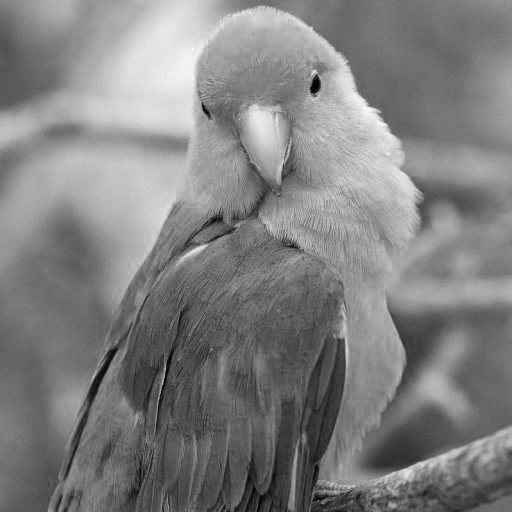

In [27]:
X_aug = iaa.FastSnowyLandscape().augment_image(X)
image.array_to_img(X_aug)

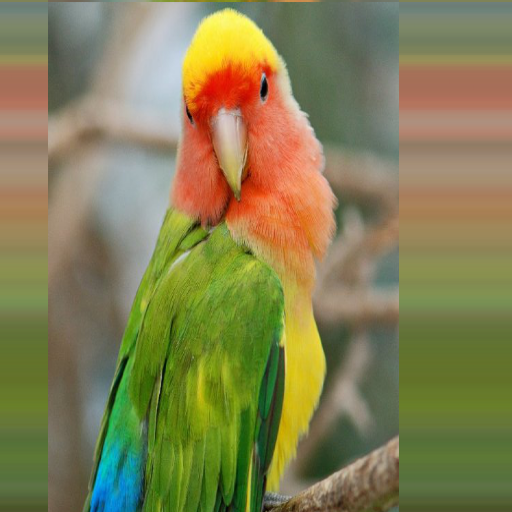

In [28]:
X_aug = iaa.CropAndPad(
            percent=(-0.05, 0.4),
            pad_mode=ia.ALL,
            pad_cval=(0, 255)
).augment_image(X)
image.array_to_img(X_aug)

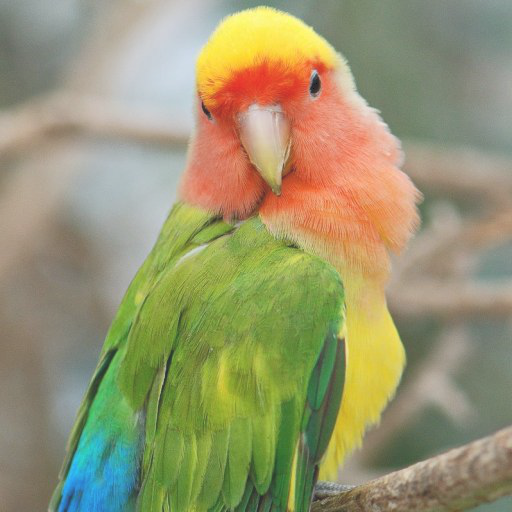

In [29]:
X_aug = iaa.Grayscale(alpha=(0.0,1.0)).augment_image(X)
image.array_to_img(X_aug)

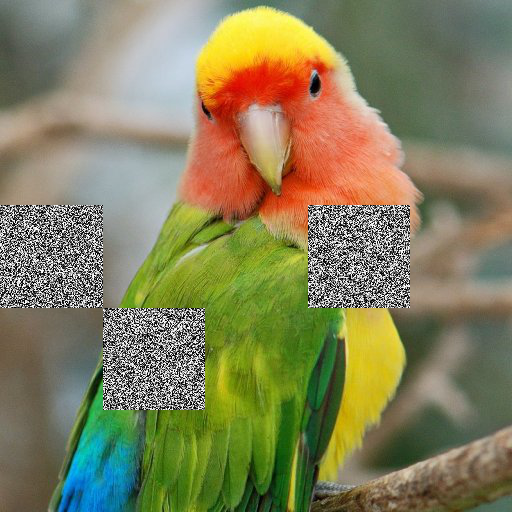

In [30]:
X_aug = iaa.CoarseSaltAndPepper(p=0.2, size_percent=0.01).augment_image(X)
image.array_to_img(X_aug)

## Paired-augmentations

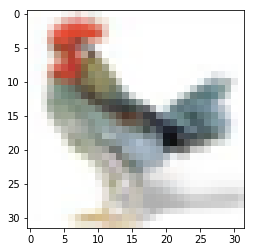

In [153]:
from keras.preprocessing import image
plt.imshow(image.array_to_img(data["X_train"][117]))

X = data["X_train"][117]

def paired(X,aug1,aug1_mag,aug2,aug2_mag):
    img = augment_and_show(X,aug1,aug1_mag)
    img_arr = image.img_to_array(img)
    return augment_and_show(img_arr, aug2, aug2_mag)

def paired_imshow(X,aug1,aug1_mag,aug2,aug2_mag):
    img = augment_and_show(X,aug1,aug1_mag)
    img_arr = image.img_to_array(img)
    img = augment_and_show(img_arr, aug2, aug2_mag)
    plt.imshow(img)

aug_type emboss
aug_type shear


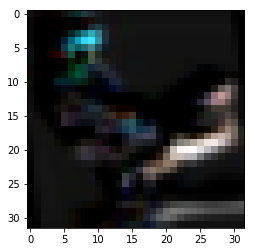

In [187]:
paired_imshow(X, "emboss",1.0,"shear",0.5)

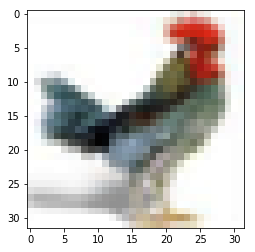

In [211]:
paired_imshow(X, "horizontal-flip",0.90,"gamma-contrast",0.87)

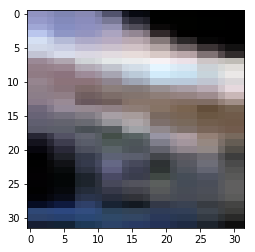

In [215]:
paired_imshow(X, "crop",0.90,"invert",0.02)

/Users/baris.ozmen/miniconda3/envs/insight/lib/python3.6/site-packages/imgaug/augmenters/meta.py:464: UserWarning: You provided a numpy array of shape (32, 32, 3) as input to augment_images(), which was interpreted as (N, H, W). The last dimension however has value 1 or 3, which indicates that you provided a single image with shape (H, W, C) instead. If that is the case, you should use augment_image(image) or augment_images([image]), otherwise you will not get the expected augmentations.
  "you will not get the expected augmentations." % (images_copy.shape,))


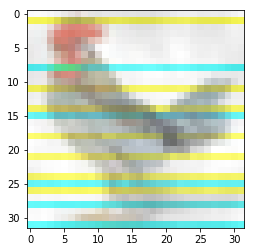

In [212]:
paired_imshow(X, "translate-x",0.33,"fog",0.46)

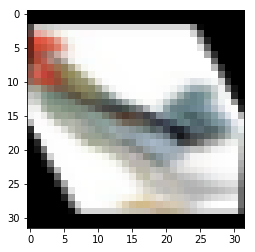

In [208]:
paired_imshow(X, "shear",0.34,"shear",0.21)

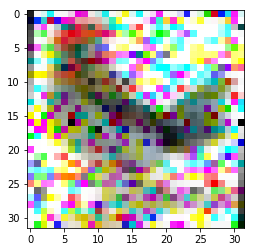

In [229]:
paired_imshow(X, "dropout",0.34,"shear",0.05)

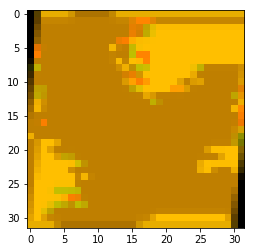

In [223]:
paired_imshow(X, "brighten",0.30,"shear",0.19)

In [44]:
"crop", "gaussian-blur", "rotate", "shear", "translate-x", "translate-y", "sharpen",
    "emboss", "additive-gaussian-noise", "dropout", "coarse-dropout", "gamma-contrast",
    "brighten", "invert", "fog", "clouds", "add-to-hue-and-saturation"

IndentationError: unexpected indent (<ipython-input-44-d32bb1cd3dce>, line 2)

In [ ]:
    elif aug_type == "histogram-equalize":
        X_aug = iaa.AllChannelsHistogramEqualization().augment_image(X) # magnitude not used
    elif aug_type == "super-pixels": # deprecated
        X_norm = normalize(X)
        X_norm2 = (X_norm*2)-1
        X_aug_norm2 = iaa.Superpixels(p_replace=(0, magnitude), n_segments=(100, 100)).augment_image(X_norm2)
        X_aug_norm = (X_aug_norm2+1)/2
        X_aug = denormalize(X_aug_norm)
    elif aug_type == "perspective-transform":
        X_norm = normalize(X)
        X_aug_norm = iaa.PerspectiveTransform(scale=(0.01, max(0.02, magnitude*0.125 ))).augment_image(X_norm) # first scale param must be larger
        np.clip(X_aug_norm, 0.0, 1.0, out=X_aug_norm)
        X_aug = denormalize(X_aug_norm)
    elif aug_type == "elastic-transform": # deprecated
        X_norm = normalize(X)
        X_norm2 = (X_norm * 2) - 1
        X_aug_norm2 = iaa.ElasticTransformation(alpha=(0.0, max(0.5, magnitude*60)), sigma=5.0).augment_image(X_norm2)
        X_aug_norm = (X_aug_norm2 + 1) / 2
        X_aug = denormalize(X_aug_norm)

In [121]:
%matplotlib inline
import matplotlib.pyplot as plt

from PIL import Image

from imgaug import augmenters as iaa

import sys
sys.path.insert(0,"../../")
from deepaugment.build_features import DataOp


data, input_shape = DataOp.load("cifar10",1000)
data = DataOp.preprocess(data)

Using 1000 training images


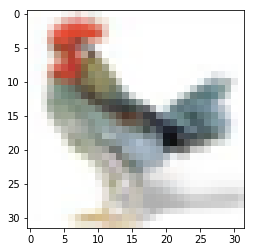

In [195]:
arr = _ih[-194:]

In [197]:
for x in arr:
    if "def augment_and_show" in x:
        print (x)

def normalize(X):
    return (X/255.).copy()

def denormalize(X):
    X_dn = (X*255).copy()
    return X_dn

def augment_and_show(X, aug_type, magnitude):
    if aug_type == "crop":
        X_aug = iaa.Crop(px=(0, int(magnitude * 512))).augment_image(X)
    elif aug_type == "gaussian-blur":
        X_aug = iaa.GaussianBlur(sigma=(0, magnitude * 5.0)).augment_image(X)
    elif aug_type == "rotate":
        X_aug = iaa.Affine(rotate = (-180 * magnitude, 180 * magnitude)).augment_image(X)
    elif aug_type == "shear":
        X_aug = iaa.Affine(shear=(-90 * magnitude, 90 * magnitude)).augment_image(X)
    elif aug_type == "translate-x":
        X_aug = iaa.Affine(
            translate_percent={
                "x": (-magnitude, magnitude),
                "y": (0, 0)
            }
        ).augment_images(X)
    elif aug_type == "translate-y":
        X_aug = iaa.Affine(
            translate_percent={
                "x": (0, 0),
                "y": (-magnitude, magnitude)
            